In [1]:
import sys
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
#Import the necessary methods from tweepy library  

#install tweepy if you don't have it
#!pip install tweepy
import tweepy
from tweepy.streaming import StreamListener
from tweepy import OAuthHandler
from tweepy import Stream

#sentiment analysis package
#!pip install textblob
from textblob import TextBlob

#general text pre-processor
#!pip install nltk
import nltk
from nltk.corpus import stopwords

#tweet pre-processor 
#!pip install tweet-preprocessor
import preprocessor as ppr

import operator 
import json
from collections import Counter
import numpy as np

In [2]:
tweets_file = 'covid19_23june2020.json'

In [26]:
tweets_data = []
for line in open(tweets_file, "r"):
    try:
        tweet = json.loads(line)
        x=tweet['text']
        tweets_data.append(tweet)
    except:
        continue


print('saved numbers of tweets: ', len(tweets_data))
tweets_data

saved numbers of tweets:  1000


[{'created_at': 'Mon Jun 29 12:51:06 +0000 2020',
  'id': 1277585384340365312,
  'id_str': '1277585384340365312',
  'text': 'The latest Financial Technology News Report! https://t.co/UhH0om1kgC Thanks to @fintechfrank #fintech #covid19',
  'source': '<a href="https://paper.li" rel="nofollow">Paper.li</a>',
  'truncated': False,
  'in_reply_to_status_id': None,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_user_id_str': None,
  'in_reply_to_screen_name': None,
  'user': {'id': 326120396,
   'id_str': '326120396',
   'name': 'Financial Technology',
   'screen_name': 'fin_tech',
   'location': 'UK',
   'url': 'https://www.moneyscience.com',
   'description': 'Financial Technology Updates from MoneyScience.',
   'translator_type': 'none',
   'protected': False,
   'verified': False,
   'followers_count': 2764,
   'friends_count': 579,
   'listed_count': 183,
   'favourites_count': 40,
   'statuses_count': 9396,
   'created_at': 'Wed Jun 29 12:10:30 +000

In [4]:
tweets = pd.DataFrame(columns=['text','lang','country'])

tweets['text'] = list(map(lambda tweet: tweet['text'], tweets_data))
tweets['lang'] = list(map(lambda tweet: tweet['lang'], tweets_data))
tweets['country'] = list(map(lambda tweet: tweet['place']['country'] if tweet['place'] != None else None, 
                             tweets_data))


tweets_by_lang = tweets['lang'].value_counts()

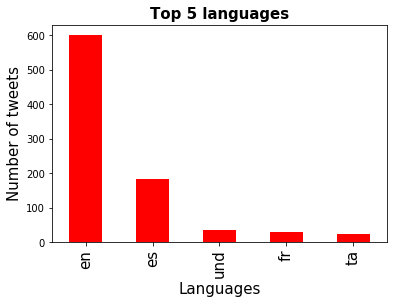

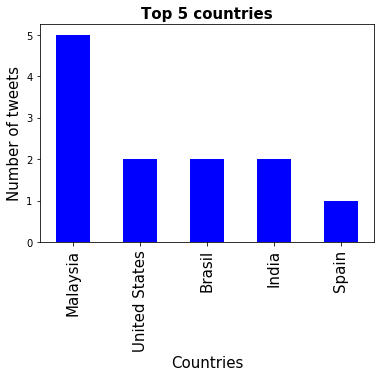

In [5]:
fig, ax = plt.subplots()
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=10)
ax.set_xlabel('Languages', fontsize=15)
ax.set_ylabel('Number of tweets' , fontsize=15)
ax.set_title('Top 5 languages', fontsize=15, fontweight='bold')
tweets_by_lang[:5].plot(ax=ax, kind='bar', color='red')

tweets_by_country = tweets['country'].value_counts()

fig, ax = plt.subplots()
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=10)
ax.set_xlabel('Countries', fontsize=15)
ax.set_ylabel('Number of tweets' , fontsize=15)
ax.set_title('Top 5 countries', fontsize=15, fontweight='bold')
tweets_by_country[:5].plot(ax=ax, kind='bar', color='blue')#


In [34]:
hashtags = pd.DataFrame(columns=['Hashtags'])
hashtags["Hashtags"] = [ hashtag['text'] for data in tweets_data for hashtag in data['entities']['hashtags'] ]
Hashtag_results = hashtags["Hashtags"].value_counts()

#top 10 most used hashtags
Hashtag_results.head(10)

COVID19                     304
Covid19                      53
covid19                      19
Coronavirus                  13
coronavirus                  11
BREAKING                     11
TamilNadu                     9
WakeupHRDpostponeNEETjee      9
Chennai                       7
SidharthShukla                6
Name: Hashtags, dtype: int64

In [25]:
# most used hashtag : COVID19 used 304 times

In [64]:
user_mentions = pd.DataFrame(columns=['user_mentions'])
user_mentions["user_mentions"] = [ user_mention['screen_name'] for data in tweets_data for user_mention in data['entities']['user_mentions'] ]
Mention_results = user_mentions["user_mentions"].value_counts()

#top 10 most used hashtags
Mention_results.head(10)

DrEricDing         23
DG_NTA             10
realDonaldTrump    10
narendramodi        8
GavinNewsom         7
HRDMinistry         7
GileadSciences      7
GovernorTomWolf     7
nayibbukele         7
QasimRashid         6
Name: user_mentions, dtype: int64

In [32]:
#most used referenced username: DrEricDing used 23 times

In [67]:
data = {'text': [], 'retweet_count': []}

for t in tweets_data:
    data['text'].append(t['text'])
    data['retweet_count'].append(t['retweet_count'])

df = pd.DataFrame(data)

In [68]:
df

,text,retweet_count
0,The latest Financial Technology News Report! h...,0
1,RT @Loi_1901: [#Loi1901] #Covid19 : Le point s...,0
2,"RT @UNDP: This #TropicsDay, visit Monpura isla...",0
3,RT @processic: จำเป็นยังไง ไม่มีผู้ติดเชื้อในป...,0
4,RT @uLerato_pillay: The urge to sound smart is...,0
...,...,...
995,"RT @koushiktweets: Tamil Nadu reports 3,949 fr...",0
996,RT @dramadelinquent: Hey #AcademicTwitter \n\n...,0
997,RT @PeteKent01: @inthecopa They never mention ...,0
998,RT @so_radhikal: It's ridiculous we still need...,0
